# Importing Libraries

In [1]:
import pandas as pd
import re

## wordcloud
from wordcloud import WordCloud, STOPWORDS

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

## sklearn - 
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

import string
import requests
import json

## nltk  
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

## Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

## spacy
import spacy

## stanza
!pip install stanza
import stanza


## pyLDAvis - for visualization  of LDA model
!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
     |████████████████████████████████| 432 kB 6.0 MB/s 
     |████████████████████████████████| 175 kB 40.3 MB/s 
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171046 sha256=03b4a829aaf45aebb6d3a78e8960656663b6393f015610ab644957d51d597b71
  Stored in directory: /root/.cache/pip/wheels/8a/4e/b6/57b01db010d17ef6ea9b40300af725ef3e210cb1acfb7ac8b6
Successfully built emoji
     |████████████████████████████████| 1.7 MB 9.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=4baa981fe01f7c9e4c938938d6618f1c59be5070fe165e234c8d35c7e9a05eb1
 

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


# Defining functions

In [2]:
def format_topics_sentences(ldamodel, corpus, texts):
    sent_topics_df = pd.DataFrame()

    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            

        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [3]:
def remove_stops_tamil(text, stops):
    text = re.sub(r"\\n", "", text)
    words = text.split()
    words = words[:7]
    final = []
    for word in words:
        if word not in stops:
            final.append(word) 
    final = " ".join(final)
    while "  " in final:
        final = final.replace("  ", " ")
    return (final)

def clean_docs(docs):
    final = []
    ## tamil stop words
    my_file = open("data/stopwords.txt", "r")
    content = my_file.read()
    content_list = content.split("\n")[:-2]
    my_file.close()
    
    for doc in docs:
        clean_doc = remove_stops_tamil(doc,content_list)
        final.append(clean_doc)
    return (final)

In [4]:
## downloading stanza for tamil ("ta")
stanza.download('ta')

def lemma_tamil(docs):
    nlp = stanza.Pipeline('ta', processors='tokenize,mwt,pos,lemma')
    final = []
    for d in docs:
        extra = []
        doc = nlp(d)
        for sentence in doc.sentences:
            for word in sentence.words:
                extra.append(word.lemma)
        final.append(extra)
    return(final)

2022-03-31 12:46:45 INFO: Downloading default packages for language: ta (Tamil)...


2022-03-31 12:47:00 INFO: Finished downloading models and saved to /root/stanza_resources.


In [5]:
def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    for text in texts:
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)

def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)

# Tamil - Thirukural

In [6]:
url = "https://raw.githubusercontent.com/vijayanandrp/Thirukkural-Tamil-Dataset/master/data/all_kural.json"
resp = requests.get(url)
data = json.loads(resp.text)
print(data)

['\nகுறள் எண்: 1 \n\nஅதிகாரம்: கடவுள் வாழ்த்து (Katavul Vaazhththu - The Praise of God)\n\nகுறள் பால்: அறத்துப்பால் (Araththuppaal - Virtue)\n\nகுறள் இயல்: பாயிரவியல் (Paayiraviyal - Prologue)\n\nகுறள் - அகர முதல எழுத்தெல்லாம் ஆதி\n       பகவன் முதற்றே உலகு. \n\nகுறள் விளக்கம்:\nசாலமன் பாப்பையா : எழுத்துக்கள் எல்லாம் அகரத்தில் தொடங்குகின்றன; (அது போல) உலகம் கடவுளில் தொடங்குகிறது.\nமு.வ : எழுத்துக்கள் எல்லாம் அகரத்தை அடிப்படையாக கொண்டிருக்கின்றன. அதுபோல உலகம் கடவுளை அடிப்படையாக கொண்டிருக்கிறது.\n\n\ntransliteration: Akara Mudhala Ezhuththellaam Aadhi\n\t\t\t\t Pakavan Mudhatre Ulaku\n \ncouplet: A, as its first of letters, every speech maintains;The "Primal Deity" is first through all the world\'s domains\n\ntranslation: \'A\' leads letters; the Ancient Lord Leads and lords the entire world\n\nexplanation: As the letter A is the first of all letters, so the eternal God is first in the world.\n\n', "\nகுறள் எண்: 2 \n\nஅதிகாரம்: கடவுள் வாழ்த்து (Katavul Vaazhththu - The Praise of God)\n

In [7]:
## storing thirukural numbers in variable - numbers
numbers = re.findall(r"(?<=குறள் எண்: ).+?(?= )", str(data))
len(numbers) 

1330

In [8]:
## storing list of kurals in variable - kural
kural = re.findall(r"(?<=குறள் -).+?(?=\.)", str(data))
len(kural)

1330

In [9]:
## storing the list of adhigarams in list variable - adhigaram
adhigaram = re.findall(r"(?<=அதிகாரம்: ).+?(?= \()", str(data))
len(adhigaram)

1330

In [10]:
## creating a dataframe to store thirukural details

df = pd.DataFrame()
df["number"] = numbers
df["kural"] = kural
df["adhigaram"] = adhigaram
df.head(3)

,number,kural,adhigaram
0,1,அகர முதல எழுத்தெல்லாம் ஆதி\n பகவன் முதற...,கடவுள் வாழ்த்து
1,2,கற்றதனால் ஆய பயனென்கொல்\n வாலறிவன் நற்ற...,கடவுள் வாழ்த்து
2,3,மலர்மிசை ஏகினான் மாணடி சேர்ந்தார்\n நில...,கடவுள் வாழ்த்து


In [14]:
## cleaning the data
cleaned = clean_docs(df["kural"])

In [15]:
print ("Original Text:")
print (df.kural[0]+"\n")

print ("Cleaned Text:")
print (cleaned[0]+"\n")

Original Text:
 அகர முதல எழுத்தெல்லாம் ஆதி\n       பகவன் முதற்றே உலகு

Cleaned Text:
அகர முதல எழுத்தெல்லாம் ஆதி பகவன் முதற்றே உலகு



In [16]:
data_words = lemma_tamil(cleaned)

2022-03-31 12:49:26 INFO: Loading these models for language: ta (Tamil):
| Processor | Package |
-----------------------
| tokenize  | ttb     |
| mwt       | ttb     |
| pos       | ttb     |
| lemma     | ttb     |

2022-03-31 12:49:26 INFO: Use device: cpu
2022-03-31 12:49:26 INFO: Loading: tokenize
2022-03-31 12:49:26 INFO: Loading: mwt
2022-03-31 12:49:26 INFO: Loading: pos
2022-03-31 12:49:27 INFO: Loading: lemma
2022-03-31 12:49:27 INFO: Done loading processors!
/usr/local/lib/python3.7/dist-packages/stanza/models/common/beam.py:86: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  prevK = bestScoresId // numWords


In [17]:
id2word = corpora.Dictionary(data_words)

corpus = []
for text in data_words:
    new = id2word.doc2bow(text)
    corpus.append(new)

In [18]:
## creating an LDA model with 133 topics - as there as 133 adhigarams in thirukural
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=133,
                                           random_state=100,
                                           update_every=1,
                                           passes=10,
                                           alpha="auto")

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

In [19]:
## printing the clusters
lda_model.print_topics()

[(14,
  '0.016*"அறிவு" + 0.016*"வலி" + 0.016*"மாந்தம்" + 0.016*"வருந்தினார்" + 0.016*"மடல்லு" + 0.016*"உழ" + 0.016*"மகிழ்ச்சி" + 0.016*"நிலம்தியல்" + 0.016*"இல்" + 0.016*"தாந்தம்"'),
 (54,
  '0.026*"கொளல்" + 0.013*"வான்சுதை" + 0.013*"ராதல்" + 0.013*"எண்ணி" + 0.013*"சால்பிற்" + 0.013*"துலையல்லார்" + 0.013*"தோல்வி" + 0.013*"கண்ணு" + 0.013*"ஒளியார்முன்" + 0.013*"ஒள்ளிய"'),
 (121,
  '0.029*"துற" + 0.029*"இறு" + 0.015*"சினம்" + 0.015*"அனையர்" + 0.015*"காணின்" + 0.015*"துணை" + 0.015*"வழிவ" + 0.015*"டடை" + 0.015*"எறிதற்கு" + 0.015*"நிர"'),
 (111,
  '0.026*"செயற்கரிய" + 0.013*"தாழாது" + 0.013*"காண்பர்" + 0.013*"நின்றாருள்" + 0.013*"அகம்நோக்கி" + 0.013*"துணர்வார்" + 0.013*"முகம்நோக்கி" + 0.013*"அறன்கடை" + 0.013*"கண்ணு" + 0.013*"அமை"'),
 (53,
  '0.044*"தரு" + 0.030*"இடும்பை" + 0.030*"தீரா" + 0.030*"தேரான்" + 0.015*"இயை" + 0.015*"உம்" + 0.015*"சுற்றம்" + 0.015*"பல்" + 0.015*"தெளி" + 0.015*"வழிமுறை"'),
 (64,
  '0.026*"உம்" + 0.013*"இருந்தேமாத்" + 0.013*"இடையறா" + 0.013*"கெடில்" + 0.013*"தீண்டு" + 

In [20]:
## visualizing the model
pyLDAvis.enable_notebook()

lda_viz = gensimvis.prepare(lda_model, corpus, id2word, mds='mmds',R=133)
lda_viz

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4     -0.380233  0.048143       1        1  1.535310
132   -0.337048  0.142734       2        1  1.368844
41    -0.169059 -0.318465       3        1  1.229094
18     0.202139  0.294747       4        1  1.218572
122    0.333364 -0.117219       5        1  1.184302
...         ...       ...     ...      ...       ...
1      0.056706 -0.057255     129        1  0.405403
121   -0.020112  0.020594     130        1  0.339464
53     0.020233  0.009783     131        1  0.332185
105    0.019078 -0.028605     132        1  0.329077
14    -0.005020 -0.017636     133        1  0.283885

[133 rows x 5 columns], topic_info=          Term        Freq       Total  Category   logprob   loglift
30         உம்  131.000000  131.000000   Default  133.0000  133.0000
195        இல்   47.000000   47.000000   Default  132.0000  132.0000
296        படு   40.000000   40.000000   Default  131.0000  131.0000
160       செய்   40.000000   40.000000   Default  130.0000  130.0000
416        தரு   25.000000   25.000000   Default  129.0000  129.0000
..         ...         ...         ...       ...       ...       ...
107  தான்நல்கா    0.003204    1.265636  Topic133   -9.0258   -0.1146
108       நெடு    0.003204    1.265636  Topic133   -9.0258   -0.1146
109       விடு    0.003204   14.810445  Topic133   -9.0258   -2.5744
110      ஈண்டு    0.003204    2.532105  Topic133   -9.0258   -0.8081
111        கம்    0.003204    3.082611  Topic133   -9.0258   -1.0048

[26291 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
4906     47  0.790160       >
278       5  0.102268       ?
278      17  0.102268       ?
278      24  0.102268       ?
278      31  0.204535       ?
...     ...       ...     ...
1018    105  0.393847   வையம்
3666     37  0.785440    வையா
661      19  0.772829  வையாது
850       3  0.753836  வையார்
816      92  0.825295    வொழு

[8867 rows x 3 columns], R=133, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 133, 42, 19, 123, 46, 48, 66, 107, 121, 20, 17, 29, 36, 77, 79, 28, 52, 13, 69, 73, 111, 93, 31, 12, 24, 114, 116, 10, 97, 95, 99, 67, 119, 109, 81, 128, 126, 117, 72, 92, 86, 56, 30, 120, 129, 71, 101, 96, 7, 124, 16, 1, 27, 53, 3, 131, 8, 23, 132, 82, 22, 90, 105, 75, 50, 4, 33, 37, 11, 18, 26, 38, 83, 47, 125, 57, 51, 94, 32, 9, 104, 100, 34, 39, 113, 40, 118, 88, 14, 49, 6, 43, 61, 91, 35, 89, 98, 63, 115, 110, 130, 59, 64, 41, 62, 87, 127, 108, 68, 45, 102, 74, 44, 103, 21, 58, 80, 84, 70, 78, 76, 25, 85, 65, 55, 112, 60, 2, 122, 54, 106, 15])

In [21]:
## creating a dataframe to know which kural is under which cluster/topic
df_topic_sents_keywords = format_topics_sentences(lda_model, corpus, data_words)

df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(2)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,18.0,0.8817,"இல், நாணு, உம், நோனா, காமமும், இன்னாச்சொல், இய...","[அகர, முதல, எழுத்தெல்லாம், ஆதி, பகவன், முதற்றே..."
1,1,41.0,0.8817,"சொல், என், நாடு, சொல்லி, உம், இல், போல், பொறுத...","[கற்றதனால், ஆய, பயனென்கொல், வாலறிவன், நற்றாள்,..."


In [22]:
df_dominant_topic[df_dominant_topic["Dominant_Topic"]==18.0].iloc[0]["Keywords"]

'இல், நாணு, உம், நோனா, காமமும், இன்னாச்சொல், இயன், அவாவெகுளி, நான்கு, அழுக்காறு'

# English - Thirukural

In [23]:
## dataset containing thirukural in english
df_ = pd.read_csv("data/kural.csv")
df_.head()

,kural
0,A is the first of the alphabet;$God is the pri...
1,"What is the use of all your learning,$if you c..."
2,Those who surrender themselves at feet of the ...
3,"Those who surrender at the feet of the one,$wh..."
4,"Fate, which impacts those in the darkness of i..."


In [24]:
text = df_["kural"]

In [25]:
## lemmatization
lemmatized_texts = lemmatization(text)
lemmatized_texts[0]

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: Sele

'first alphabet;$God primary force world'

In [26]:
data_words = gen_words(lemmatized_texts)
data_words[0]

['first', 'alphabet', 'god', 'primary', 'force', 'world']

In [27]:
## TF-IDF
vectorizer = TfidfVectorizer(
                                lowercase=True,
                                max_features=100,
                                max_df=0.8,
                                min_df=5,
                                ngram_range = (1,3),
                                stop_words = "english"

                            )

In [28]:
vectors = vectorizer.fit_transform(lemmatized_texts)

dense = vectors.todense()

denselist = dense.tolist()

In [29]:
## getting features
feature_names = vectorizer.get_feature_names()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [30]:
all_keywords = []
for description in denselist:
    x=0
    keywords = []
    for word in description:
        if word > 0:
            keywords.append(feature_names[x])
        x=x+1
    all_keywords.append(keywords)

In [31]:
# KMeans
true_k = 133

model = KMeans(n_clusters=true_k, init="k-means++", max_iter=100, n_init=1)
model.fit(vectors)

order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [32]:
kmean_indices = model.fit_predict(vectors)

pca = PCA(n_components=2)
scatter_plot_points = pca.fit_transform(vectors.toarray())

x_axis = [o[0] for o in scatter_plot_points]
y_axis = [o[1] for o in scatter_plot_points]

/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  kwargs['lwork'] = ret[-2][0].real.astype(numpy.int)
/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, ch

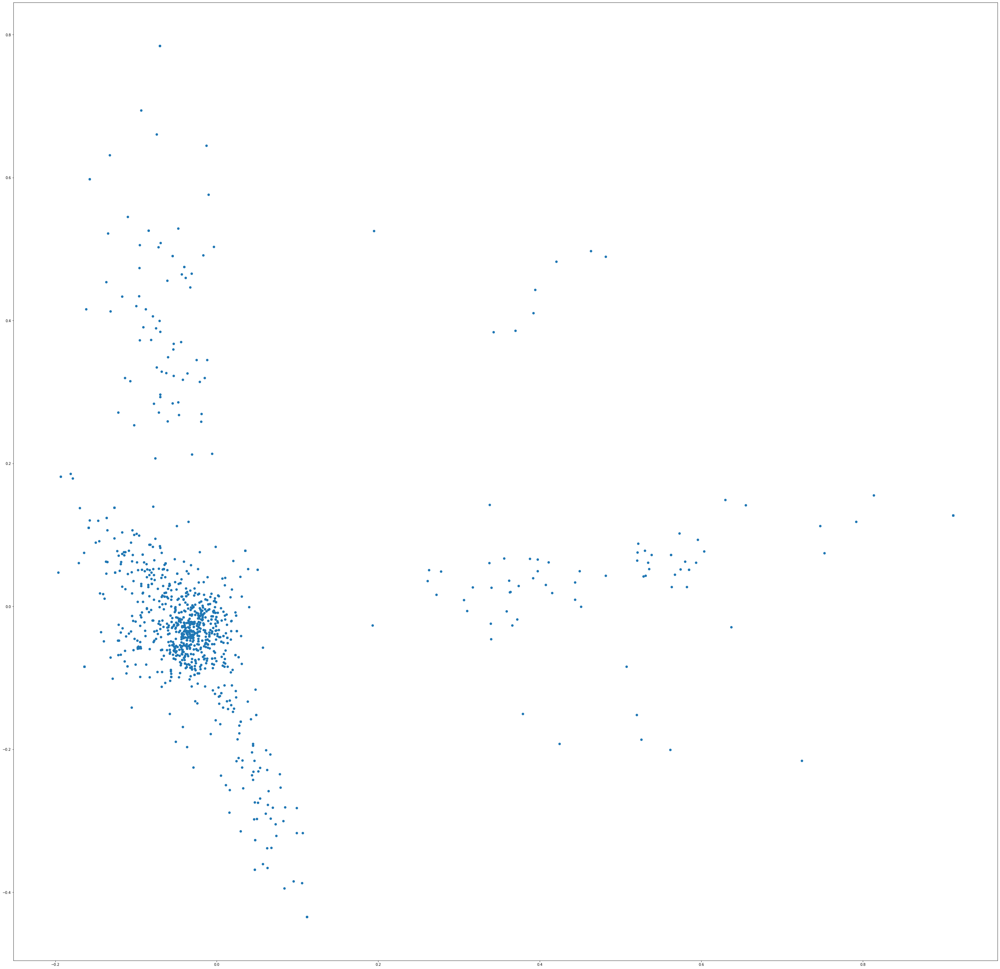

In [33]:
fig, ax = plt.subplots(figsize=(50, 50))
ax.scatter(x_axis, y_axis)


In [34]:
id2word = corpora.Dictionary(data_words)

corpus = []
for text in data_words:
    new = id2word.doc2bow(text)
    corpus.append(new)

print (corpus[0])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]


In [35]:
## LDA Model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=133,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a diffe

In [ ]:
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word, mds='mmds',R=133)
vis


/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
9     -0.544202 -0.036350       1        1  8.038633
79    -0.488518  0.179841       2        1  3.806375
73    -0.252937 -0.418530       3        1  3.598805
127    0.238716  0.431195       4        1  3.421554
32     0.439860 -0.205598       5        1  2.876776
...         ...       ...     ...      ...       ...
80     0.008535 -0.004280     129        1  0.098032
27     0.008535 -0.004280     130        1  0.098032
78     0.008535 -0.004280     131        1  0.098032
76     0.008535 -0.004280     132        1  0.098032
66     0.008535 -0.004280     133        1  0.098032

[133 rows x 5 columns], topic_info=         Term        Freq       Total  Category   logprob   loglift
21       will  472.000000  472.000000   Default  133.0000  133.0000
362      when  341.000000  341.000000   Default  132.0000  132.0000
6         can  289.000000  289.000000   Default  131.0000  131.0000
165      love  243.000000  243.000000   Default  130.0000  130.0000
57      other  181.000000  181.000000   Default  129.0000  129.0000
..        ...         ...         ...       ...       ...       ...
128     ankus    0.003667    1.259196  Topic133   -8.0314    1.0889
129      call    0.003667   15.483426  Topic133   -8.0314   -1.4204
130  controls    0.003667    1.259196  Topic133   -8.0314    1.0889
131  elephant    0.003667    2.403521  Topic133   -8.0314    0.4424
132    future    0.003667    3.832987  Topic133   -8.0314   -0.0243

[34907 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
136      22  0.849533    ability
307      34  0.426161       able
314      75  0.942431        add
124      61  0.542708  admirable
377      18  0.858067  affection
...     ...       ...        ...
464       3  0.736718      words
5        20  0.989928      world
292       4  0.889552     worthy
75       53  0.905551        yet
172      18  0.961515      yield

[359 rows x 3 columns], R=133, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 80, 74, 128, 33, 126, 9, 25, 6, 60, 19, 92, 119, 82, 34, 106, 69, 133, 120, 112, 64, 127, 68, 93, 110, 1, 129, 37, 36, 78, 22, 58, 123, 48, 115, 14, 49, 52, 108, 40, 31, 3, 121, 51, 57, 26, 53, 61, 124, 72, 103, 131, 125, 47, 44, 12, 16, 56, 54, 11, 45, 85, 42, 55, 89, 41, 2, 95, 70, 109, 122, 39, 76, 107, 21, 23, 66, 13, 102, 105, 101, 104, 27, 111, 113, 114, 116, 117, 118, 8, 7, 99, 5, 4, 130, 132, 100, 17, 98, 46, 20, 65, 63, 62, 59, 50, 43, 73, 38, 35, 24, 32, 30, 29, 71, 18, 97, 87, 96, 94, 15, 91, 90, 88, 86, 75, 84, 83, 81, 28, 79, 77, 67])

In [36]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_words)

df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(2)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,111.0,0.6235,"world, first, charity, force, primary, alphabe...","[first, alphabet, god, primary, force, world]"
1,1,67.0,0.3748,"if, use, mean, learning, spend, ideal, require...","[use, learning, if, can, surrender, foot]"


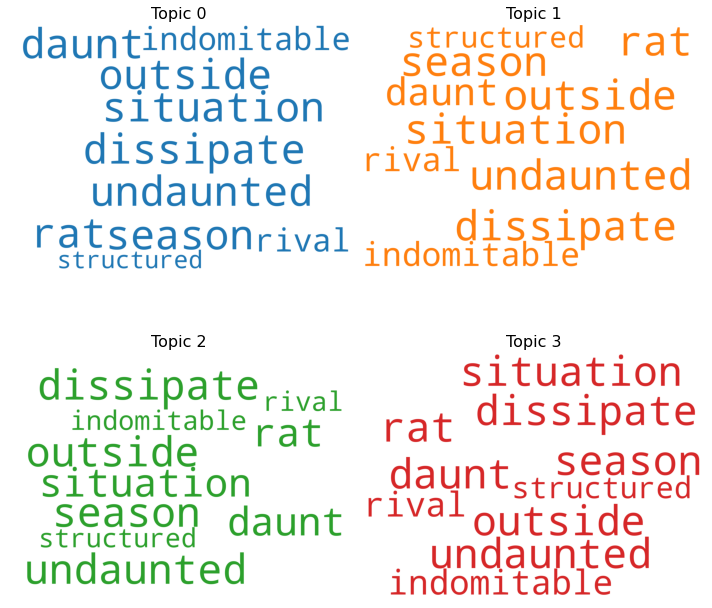

In [37]:
## wordcloud 
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
stop_words = stopwords.words('english')

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()